FALTA VER:

- caso en que los recuadros de las moscas exceden los limites de la imagen
- que pasa con los recortes de los recuadors no enteros para el dataset de entrenamiento


In [1]:
# librerias

import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd


In [2]:
# parametros

rect = 150

# crea el dataframe

drosophila = pd.DataFrame(columns=['id', 'pixels' ,'x', 'y', 'sex', 'state', 'targetX', 'targetY'])

path = pd.DataFrame(columns=['id', 'targetX', 'targetY'])


path.loc[len(path.index)] = [-2, 100, 100] # agrega la posicion del laser 

font = cv2.FONT_HERSHEY_SIMPLEX

In [3]:

# incrementa el brillo de la imagen

def increase_brightness(img, value = 30):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    return img

In [4]:
# binarizacion, br cantidad de brillo, gb = kernel del gaussian blur, li y ls limites superior e inferior del theadhold

def image_threshold(img, br = 150, gb = 3, li = 230, ls= 255):
    img_b = increase_brightness(img, value=br)
    img_b  = cv2.cvtColor(img_b, cv2.COLOR_BGR2GRAY)
    img_b = cv2.GaussianBlur(img_b, (gb,gb), 0)
    _, img_c = cv2.threshold(img_b, li, ls, cv2.THRESH_BINARY)
    return img_c

In [5]:
# Morphological Operations: erosiona y dilata ... k tamano del kernel, d_iter, e_iter iteraciones en dilatacion y erosion

def image_erodil(img, d_iter = 10, e_iter = 10, k = 3):
    # erossion and dilatation
    kernel = np.ones((k,k), np.uint8)

    img = cv2.dilate(img, kernel, iterations = d_iter)
    img = cv2.erode(img, kernel, iterations = e_iter)
    return  img


In [6]:
def image_overlap(img, rect= 150, show = False):
    
        temp_cont, _ = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        ret = 'sin clasificar'

        if (len(temp_cont)>1):                      # cuenta contornos en temp_img
            
            ret = 'overlaped'

            if show:                                # imprime superposición
                plt.figure(figsize = (100,10))
                plt.imshow(img)
            
        return ret
    

MODEL LOAD

In [7]:
import torch
import torch.nn as nn
from torchvision.transforms import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import os
import torchvision


In [8]:
CANTIDAD_CLASES = 2
ANCHO_IMAGENES = 144
ALTO_IMAGENES = 144

In [9]:
class InsectClassifier(torch.nn.Module):
    def __init__(self, output_units):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding='same') # 144 x 144
        self.pool1 = torch.nn.MaxPool2d(kernel_size=2, stride=2) # 72 x 72
        self.conv2 = torch.nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding='same')
        self.pool2 = torch.nn.MaxPool2d(kernel_size=2, stride=2) # 36 x 36
        self.conv3 = torch.nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding='same')
        self.pool3 = torch.nn.MaxPool2d(kernel_size=2, stride=2) # 18 x 18
        self.conv4 = torch.nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding='same')
        self.pool4 = torch.nn.MaxPool2d(kernel_size=2, stride=2) # 9 x 9
        self.fc1 = torch.nn.Linear(in_features=128*9*9, out_features=512)       ## MODIF
        #output_units = 1 ## MODIF 
        self.fc2 = torch.nn.Linear(in_features=512, out_features=output_units)  

    def forward(self, x):
        x = self.pool1(torch.relu(self.conv1(x)))
        x = self.pool2(torch.relu(self.conv2(x)))
        x = self.pool3(torch.relu(self.conv3(x)))
        x = self.pool4(torch.relu(self.conv4(x)))
        x = torch.flatten(x, 1)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        #return x
        return torch.sigmoid(x) ## MODIF 

In [10]:
model = InsectClassifier(CANTIDAD_CLASES)
#model = InsectClassifier().to(device)

In [12]:
# Cargar los pesos entrenados
model.load_state_dict(torch.load('01_nn1_modelo_insectos400.pth'))
model.eval()  # Establecer el modelo en modo de evaluación

InsectClassifier(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (pool4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=10368, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=2, bias=True)
)

In [13]:
# Definir la transformación de datos para el conjunto de prueba
transform = transforms.Compose([
    transforms.Resize((144, 144)),
    transforms.ToTensor(),
])


In [14]:
from PIL import Image

def preprocesar_imagen(array_img):
    transformacion = torchvision.transforms.Compose([
        torchvision.transforms.Resize(size=(ANCHO_IMAGENES, ALTO_IMAGENES)),
        torchvision.transforms.ToTensor(),
        #torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    imagen = Image.fromarray(array_img)
    #imagen = Image.open(imagen_path)
    imagen = transformacion(imagen)
    imagen = imagen.unsqueeze(0)  # Agregar dimensión batch
    return imagen

In [15]:
def predecir_imagen(array_img, modelo):
    
    imagen = preprocesar_imagen(array_img)

    with torch.no_grad():
        salida = modelo(imagen)
    output = salida.numpy()
    
    c = (max(output[0][0], output[0][1])/(output[0][0] + output[0][1]))

    _, indice_prediccion = torch.max(salida, 1)
    
    return indice_prediccion.item(), c

In [16]:
#from super_gradients.training import models

#best_model = models.get(
#    'yolo_nas_l',
#    num_classes=2,
#    checkpoint_path='./ds1_checkpoints/ds1/RUN_20240126_173824_412837/average_model.pth'
#)

In [25]:
import random


def img_ramdom(img):
    sex = random.choice(["f", "m"])
    conf = 1.00
    return sex, conf

#def img_yolonas(img):
#    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#    cv2.imwrite('temp.png' , img)
#    pa = 'temp.png'
#    p = best_model.predict(pa, max_predictions=1, fuse_model=False)
#    conf = p.prediction.confidence[0]
#    if (p.prediction.labels[0]==1) or (conf<=0.65): 
#        sex = 'f' 
#    else: 
#        sex = 'm'
#    print(sex, conf)
#    return sex, conf

def img_nn(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    p, c = predecir_imagen(img, model)

    if (p==0):# or (c<=0.9): 
        sex = 'f' 
    else: 
        sex = 'm'
    print(sex, c)
    return sex, c



def img_classification(img):
    #sex, conf = img_ramdom(img)
    sex, conf = img_nn(img)
    return sex, conf


In [18]:

def image_addBoundingbox(img, x0, y0, ov, text, q, y_text = 10, s = "n/a", conf = 0.0):
    c = (0,0,0)
    if ov == "sin clasificar": c = (0,128,0)        # verde
    if ov == "overlaped": c = (255,0,0)             # rojo
    if ov == "fuera umbral 1": c = (0,0,0)          # negro
    if ov == "fuera umbral 2": c = (255,255,0)        # marron
    if ov == "classified": 
        if s == "f": c = (255,0,255)      # rosa
        if s == "m": c = (0,0,255)        # azul
    cv2.rectangle(img, (x0, y0), (x0+rect, y0+rect), c, 5)

    if text:
        cv2.putText(img, str(q), (x0, y0-y_text), font, 1, c, 2, cv2.LINE_AA)

    if conf>0:
        cv2.putText(img, str(conf), (x0+100, y0-y_text), font, .8, c, 2, cv2.LINE_AA)

    
    return img


In [19]:
# detecta y analiza contornos, t? rect: tamanno del recuadro, pMin, pMax: % maximo y minimo de pixes ocupados

def image_contours(img_t, img_o, drosophila, writePNG = False, t = 10, rect = 150, pMin = 4, pMax = 20):
    img_t = cv2.bitwise_not(img_t)
    contornos, _ = cv2.findContours(img_t, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    img_fin = img_o.copy()

    hmin = 20
    wmin = 20
    hmax = 120
    wmax = 120
    y_text = 10

    cont = 0
    p = 0
    for c in contornos:
        if len(c)>t:                                # que carajos es t??? y este proc???

            (x, y, w, h) = cv2.boundingRect(c)                          # realiza el bounding box

            x0 = int((x + w/2) - (rect/2))                              # localiza la coordenada x0 basado en el tamaño del recuadro
            y0 = int((y + h/2) - (rect/2))                              # localiza la coordenada y0 basado en el tamaño del recuadro
            
            cont = cont + 1                                             # incrementa la cantidad de objetos encontrados
            
            if ((h>hmin) and (w>wmin)) and ((h<hmax) and (w<wmax)):     # tamaño minimo y maximo del recuadro

                roi1 = img_t[y0:y0+rect, x0:x0+rect]                    # roi de imagen binarizada
                q = cv2.countNonZero(roi1)                              # calculo de % de pixels ocupados
                p = round((q/(rect*rect))*100, 1)
                
                if (p>pMin) and (p<pMax):                               # seleccion de % minimo y maximo

                    ov = image_overlap(roi1)                            # verifica superposición de imagenes
                
                    if writePNG:
                        roi = img_o[y0:y0+rect, x0:x0+rect] 
                        cv2.imwrite(str(cont)+'.png', roi)
                    
                else:

                    ov = "fuera umbral 1"
                
            else:

                ov = "fuera umbral 2"
            

            img_fin = image_addBoundingbox(img_fin, x0, y0, ov, True, cont, y_text)

            drosophila.loc[len(drosophila.index)] = [cont, p, x0, y0, "n/a", ov, 0, 0]   # registra el roi


    return img_fin    

In [20]:
# marca el centro de masa, cross tamaño de la mira

def roi_target(roi, img, x0, y0, cross = 30):
    
    c = int(cross/2)                         #  la cruz tiene 2*cross de lado
    
    eyes_lo=np.array([90,60,60])
    eyes_hi=np.array([125,85,85])

    mask=cv2.inRange(roi, eyes_lo, eyes_hi)
    M = cv2.moments(mask)
 

    # calculate x,y coordinate of center
    x = int(M["m10"] / M["m00"])
    y = int(M["m01"] / M["m00"])
 
    x = x0 + x
    y = y0 + y

    # put text and highlight the center
    cv2.circle(img, (x, y), 5, (255, 255, 255), -1)
    cv2.putText(img, "target", (x - 25, y - 25), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
 
    cv2.line(img, (x, y-c), (x, y+c), (255, 255, 0), 2) 
    cv2.line(img, (x-c, y), (x+c, y), (255, 255, 0), 2) 

    return x, y, img
    


In [21]:
# marca el centro de masa, cross tamaño de la mira (teniendo en cuenta que son boundingboxes con errores)

def roi_target_plus(roi, img, x0, y0, path, cross = 30):
    
    c = int(cross/2)                         #  la cruz tiene 2*cross de lado

    roi = cv2.bitwise_not(roi)

    kernel = np.ones((3,3), np.uint8)
    roi = cv2.erode(roi, kernel, iterations = 10)
    contornos, _ = cv2.findContours(roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


    for contor in contornos:
        (x, y, w, h) = cv2.boundingRect(contor) 
        x = int(x + w/2) + x0
        y = int(y + h/2) + y0

        # put text and highlight the center
        cv2.circle(img, (x, y), 5, (255, 255, 255), -1)
        cv2.putText(img, "target", (x - 25, y - 25), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
 
        cv2.line(img, (x, y-c), (x, y+c), (255, 255, 0), 2) 
        cv2.line(img, (x-c, y), (x+c, y), (255, 255, 0), 2) 

        path.loc[len(path.index)] = [-1, x, y] 

    return x, y, img
    

In [22]:
def xyRepair(x0, y0, rect = 150):
    # faltaria cubrir si se pasa de la imagen, es decir si x+150 > ancho de la imagen

    x1 = x0
    y1 = y0
    x2 = x0 + rect
    y2 = y0 + rect

    if ((x0<0) or (y0<0)):
        if (y0<0):
            y1 = 0
            y2 = rect+y0
        if (x0<0):
            x1 = 0
            x2 = rect+x0

    return x1,y1,x2,y2

In [23]:
def image_classification(img, img_de, drosophila, path, rect = 150):

    # recorre el dataset de las que estan en estado "sin clasificar"

    img_f = img.copy()

    for _, row in drosophila.iterrows():

        targetX = 0
        targetY = 0

        x0 = int(row.x)
        y0 = int(row.y)

        roi = img[y0:y0+rect, x0:x0+rect]  
        st = row.state

        s = 'n/a'
        conf = 0.0
        if (row.state == 'sin clasificar'):
            s, conf = img_classification(roi)                                                 # clasifica la mosca
            st = 'classified'
            

        if (s=="f"):
            x1, y1, x2, y2 = xyRepair(x0, y0, rect)
            roi = img[y1:y2, x1:x2]  
            targetX, targetY, img_f = roi_target(roi, img_f, x1, y1, 30)                    # encuentra punto de target de moscas ok
            path.loc[len(path.index)] = [row.id, targetX, targetY]                          # registra el target

        if (st != "classified"): # and ((x0>0) and (y0>0)):
            x1, y1, x2, y2 = xyRepair(x0, y0, rect)
            roi = img_de[y1:y2, x1:x2]  
            targetX, targetY, img_f = roi_target_plus(roi, img_f, x1, y1, path, 30)                  # encuentra punto de target de moscas con problemas

        # actualiza el dataframe
        drosophila.loc[drosophila['id'] == row.id, ['state']] = st
        drosophila.loc[drosophila['id'] == row.id, ['sex']] = s
        drosophila.loc[drosophila['id'] == row.id, ['targetX']] = targetX
        drosophila.loc[drosophila['id'] == row.id, ['targetY']] = targetY
        

        # redibuja boundingboxes
        #if ((s=="f") or (s=="m")): 
        img_f = image_addBoundingbox(img_f, x0, y0, st, True, row.id, 10, s, conf)

    return img_f

f 0.99989015
f 0.84072125
f 0.7580821
f 0.9895965
f 0.80988926
f 0.9911259
f 0.7475148
f 0.9991182
m 0.80934757
m 0.5933165
f 0.646411
f 0.74282724
f 0.6502691
f 0.69309783
m 0.7220921
f 0.9035192
f 0.55263007
f 0.92275196
f 0.8732421
f 0.7915165
f 0.99998534
f 0.737134
f 0.9999223
f 0.99995685
f 0.825336
f 0.9853632
f 0.98928463
f 0.99929297
f 0.7250793
f 0.9988712
f 0.7176269
f 0.96720403
f 0.9999874
f 0.99987745
f 0.55637646
f 0.99997205
f 0.99963224
f 0.99227214
f 0.9938074
f 0.84464765
f 0.9999709
f 0.99999446
m 0.5697248
f 0.6524991
f 0.99868935
f 0.6568437
f 0.81589204
m 0.9416367
f 0.9871597
f 0.9442277
f 0.9968437
m 0.94590545
f 0.9496358
f 0.99868923
f 0.78898877
f 0.9640137
f 0.95822495
f 0.999201
f 0.9998581
f 0.5196494
f 0.99957365
f 0.9777516
f 0.9992876
m 0.5471951
f 0.6557037
f 0.9463185
f 0.9782895


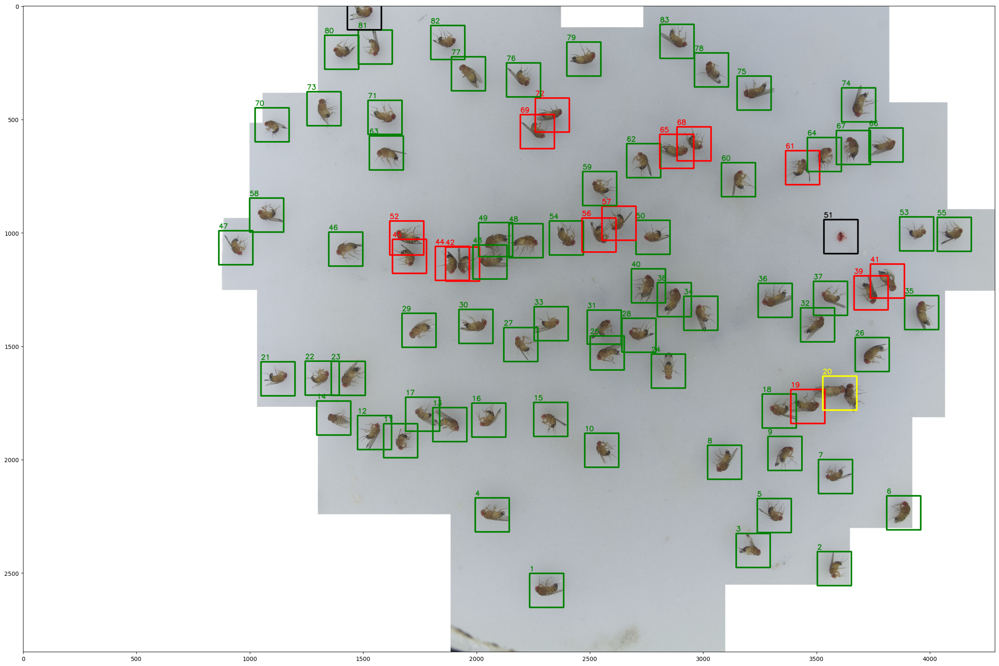

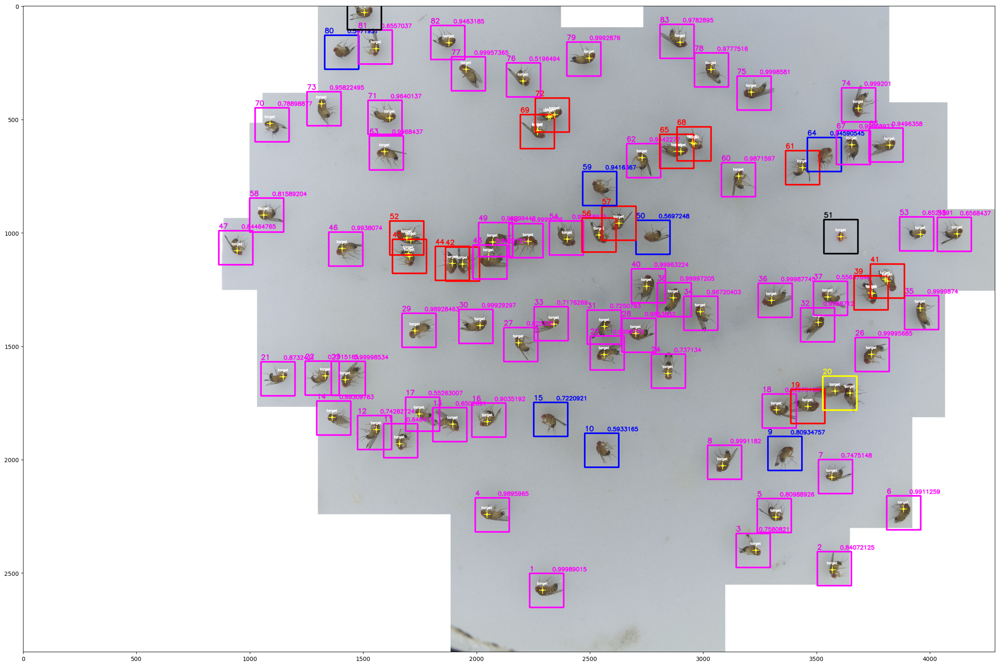

In [26]:
img_orig = cv2.imread('images/Fotos 1-11-097.jpeg', cv2.COLOR_BGR2RGB) 
img_orig = cv2.cvtColor(img_orig, cv2.COLOR_RGB2BGR)

img_pre = image_threshold(img_orig, 150, 3, 230, 255)
img_de = image_erodil(img_pre, 10, 10, 3)

#plt.figure(figsize = (200,20))
#plt.imshow(img_de) 

img_c = image_contours(img_de, img_orig, drosophila, False)

plt.figure(figsize = (200,20))
plt.imshow(img_c) 

# clasifica, genera el target y el recorrido del laser en las que estan verde (sin clasificar)

img_f = image_classification(img_orig, img_de, drosophila, path, rect = 150)

plt.figure(figsize = (200,20))
plt.imshow(img_f)

In [27]:
drosophila.head()


,id,pixels,x,y,sex,state,targetX,targetY
0,1,12.5,2234,2502,f,classified,2291,2576
1,2,6.9,3503,2406,f,classified,3569,2486
2,3,7.6,3145,2326,f,classified,3232,2400
3,4,11.3,1994,2169,f,classified,2046,2242
4,5,7.2,3238,2172,f,classified,3320,2254


In [28]:
drosophila.tail()

,id,pixels,x,y,sex,state,targetX,targetY
163,80,7.2,1330,129,m,classified,0,0
164,81,5.0,1478,106,f,classified,1557,188
165,82,8.6,1798,86,f,classified,1878,162
166,83,8.8,2809,81,f,classified,2898,160
167,84,0.0,1430,-45,n/a,fuera umbral 1,1505,29


In [29]:
path.head(100)

,id,targetX,targetY
0,-2,100,100
1,1,2291,2576
2,2,3569,2486
3,3,3232,2400
4,4,2046,2242
...,...,...,...
95,-1,3461,1766
96,-1,3581,1698
97,-1,3647,1707
98,-1,3740,1265


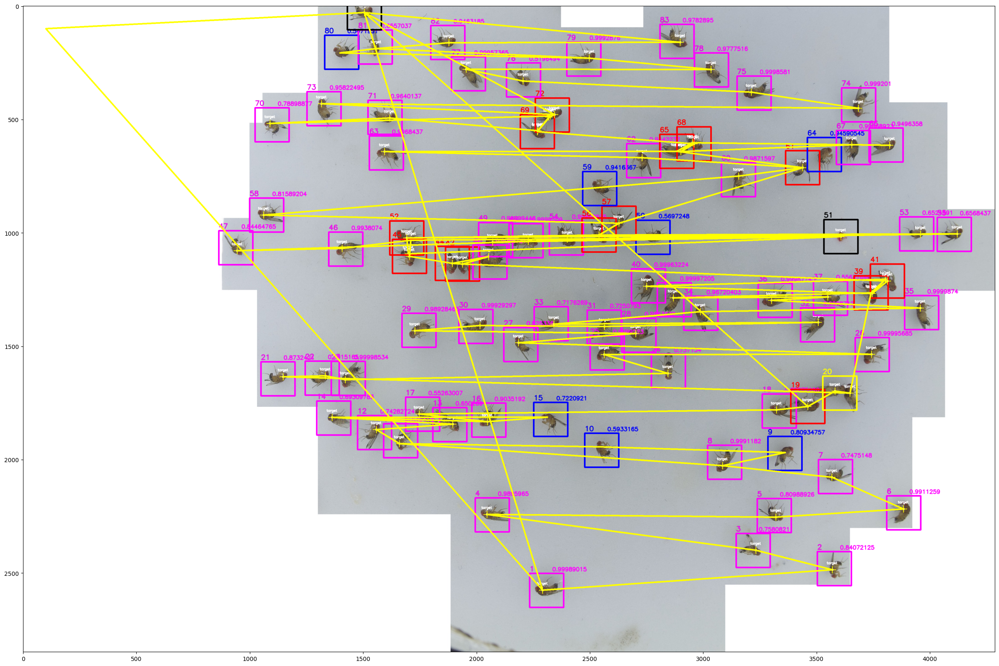

In [30]:

x0 = xf = int(path.targetX.iloc[0])
y0 = yf = int(path.targetY.iloc[0])

for _, row in path.iterrows():
    
    x1 = int(row.targetX)
    y1 = int(row.targetY)
    
    cv2.line(img_f, (x0, y0), (x1, y1), (255, 255, 0), 5) 
    x0 = x1
    y0 = y1
    
cv2.line(img_f, (x0, y0), (xf, yf), (255, 255, 0), 5)

plt.figure(figsize = (200,20))
plt.imshow(img_f)


In [31]:
# Eliminar duplicados 

print('puntos iniciales: ', len(path))
path = path.drop_duplicates(['targetX','targetY'])
print('funtos duplicados: ', len(path))


puntos iniciales:  213
funtos duplicados:  93


In [32]:
# calcula la matriz de distancias

n = len(path)
adj_mat = np.ones((n,n)) * np.inf  # genera una matriz adj_mat llena de infinito
for i in range(n):
    for j in range(i, n):
        if (i!=j):
            point1 = np.array([path.iloc[i].targetX, path.iloc[i].targetY])
            point2 = np.array([path.iloc[j].targetX, path.iloc[j].targetY])
            dist = np.linalg.norm(np.subtract(point1, point2))
            if dist==0: print(i, j)
            adj_mat[i][j] = adj_mat[j][i] = dist     # calcula la distancia euclidiana



In [33]:
# grafico solucion

def route_graph(img, t_path, g_path):

    img_laser = img.copy()

    x0 = xf = int(t_path.iloc[g_path[0]].targetX) 
    y0 = yf = int(t_path.iloc[g_path[0]].targetY)

    for i in range(len(g_path)):

        x1 = int(t_path.iloc[g_path[i]].targetX)
        y1 = int(t_path.iloc[g_path[i]].targetY)

        cv2.line(img_laser, (x0, y0), (x1, y1), (255, 0, 0), 5) 

        cv2.circle(img_laser, (x0, y0), 5, (255, 255, 255), -1)
        cv2.putText(img_laser, str(t_path.iloc[g_path[i]].id), (x0 - 25, y0 - 25), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
        c = 15
        cv2.line(img_laser, (x0, y0-c), (x0, y0+c), (255, 255, 0), 2) 
        cv2.line(img_laser, (x0-c, y0), (x0+c, y0), (255, 255, 0), 2) 
        
        x0 = x1
        y0 = y1

    cv2.line(img_laser, (x0, y0), (xf, yf), (255, 0, 0), 5)

    plt.figure(figsize = (200,20))
    plt.imshow(img_laser)

[0, 76, 81, 88, 89, 92, 90, 85, 84, 79, 75, 80, 78, 74, 87, 91, 86, 83, 73, 69, 72, 68, 66, 62, 61, 59, 52, 53, 47, 45, 46, 48, 56, 49, 57, 50, 63, 51, 22, 23, 24, 14, 12, 11, 17, 13, 16, 15, 10, 26, 32, 29, 42, 39, 35, 25, 8, 9, 18, 19, 20, 21, 27, 43, 40, 41, 44, 36, 58, 60, 70, 71, 82, 65, 64, 54, 34, 28, 31, 30, 67, 77, 4, 1, 3, 5, 7, 6, 2, 33, 38, 37, 55, 0]
size:  23783.615035832972


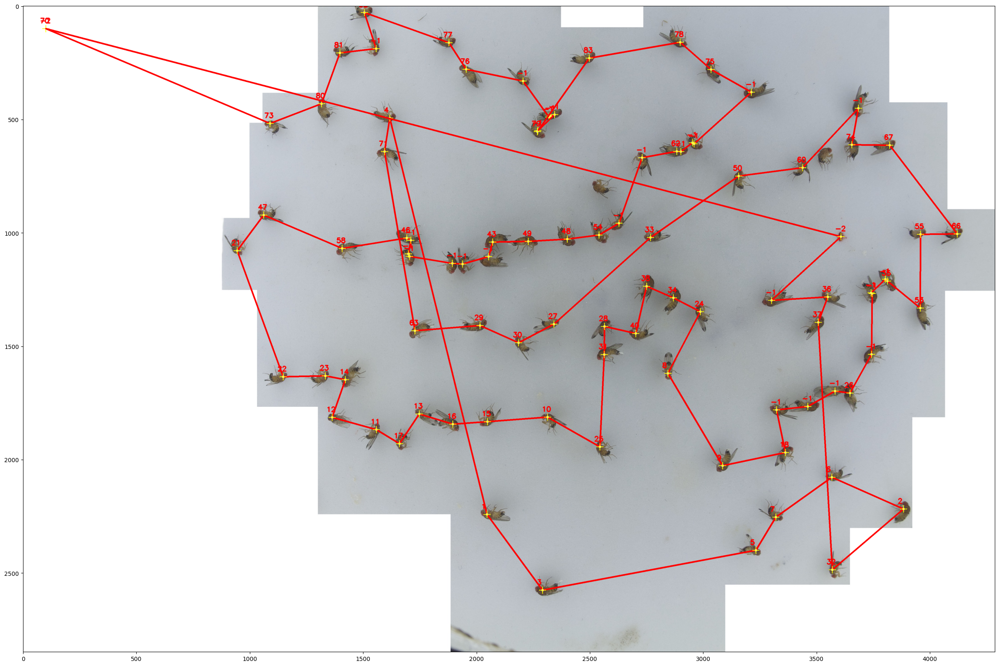

In [34]:
# GREEDY

mat = adj_mat.copy()
g_path = []
g_path.append(0)
i = 0
d = 0

while (np.min(mat)<np.inf):
    j = np.where(mat[i]==np.min(mat[i]))[0][0]
    d = d + np.min(mat[i])
    mat[i, :] = mat[:, i] = np.inf
    g_path.append(j)
    i = j

g_path.append(0)
print(g_path)
len(g_path)
print('size: ', d)
route_graph(img_orig, path, g_path)


In [37]:
s = []
for i in range(len(g_path)-1):
    s.append((g_path[i],g_path[i+1]))

sg = (s, d)

print (sg)

([(0, 76), (76, 81), (81, 88), (88, 89), (89, 92), (92, 90), (90, 85), (85, 84), (84, 79), (79, 75), (75, 80), (80, 78), (78, 74), (74, 87), (87, 91), (91, 86), (86, 83), (83, 73), (73, 69), (69, 72), (72, 68), (68, 66), (66, 62), (62, 61), (61, 59), (59, 52), (52, 53), (53, 47), (47, 45), (45, 46), (46, 48), (48, 56), (56, 49), (49, 57), (57, 50), (50, 63), (63, 51), (51, 22), (22, 23), (23, 24), (24, 14), (14, 12), (12, 11), (11, 17), (17, 13), (13, 16), (16, 15), (15, 10), (10, 26), (26, 32), (32, 29), (29, 42), (42, 39), (39, 35), (35, 25), (25, 8), (8, 9), (9, 18), (18, 19), (19, 20), (20, 21), (21, 27), (27, 43), (43, 40), (40, 41), (41, 44), (44, 36), (36, 58), (58, 60), (60, 70), (70, 71), (71, 82), (82, 65), (65, 64), (64, 54), (54, 34), (34, 28), (28, 31), (31, 30), (30, 67), (67, 77), (77, 4), (4, 1), (1, 3), (3, 5), (5, 7), (7, 6), (6, 2), (2, 33), (33, 38), (38, 37), (37, 55), (55, 0)], 23783.615035832972)


([(0, 76), (76, 81), (81, 67), (67, 77), (77, 88), (88, 92), (92, 89), (89, 90), (90, 85), (85, 84), (84, 74), (74, 78), (78, 79), (79, 75), (75, 80), (80, 87), (87, 91), (91, 86), (86, 83), (83, 73), (73, 69), (69, 72), (72, 68), (68, 66), (66, 64), (64, 65), (65, 71), (71, 82), (82, 70), (70, 58), (58, 60), (60, 36), (36, 44), (44, 41), (41, 40), (40, 43), (43, 27), (27, 21), (21, 7), (7, 6), (6, 2), (2, 5), (5, 3), (3, 1), (1, 4), (4, 11), (11, 12), (12, 14), (14, 24), (24, 23), (23, 22), (22, 51), (51, 63), (63, 50), (50, 57), (57, 49), (49, 56), (56, 48), (48, 46), (46, 45), (45, 47), (47, 53), (53, 52), (52, 59), (59, 61), (61, 62), (62, 54), (54, 34), (34, 28), (28, 31), (31, 30), (30, 17), (17, 13), (13, 16), (16, 15), (15, 10), (10, 26), (26, 32), (32, 29), (29, 42), (42, 39), (39, 35), (35, 25), (25, 8), (8, 9), (9, 18), (18, 19), (19, 20), (20, 33), (33, 37), (37, 38), (38, 55), (55, 0)], 25096.780826635742)


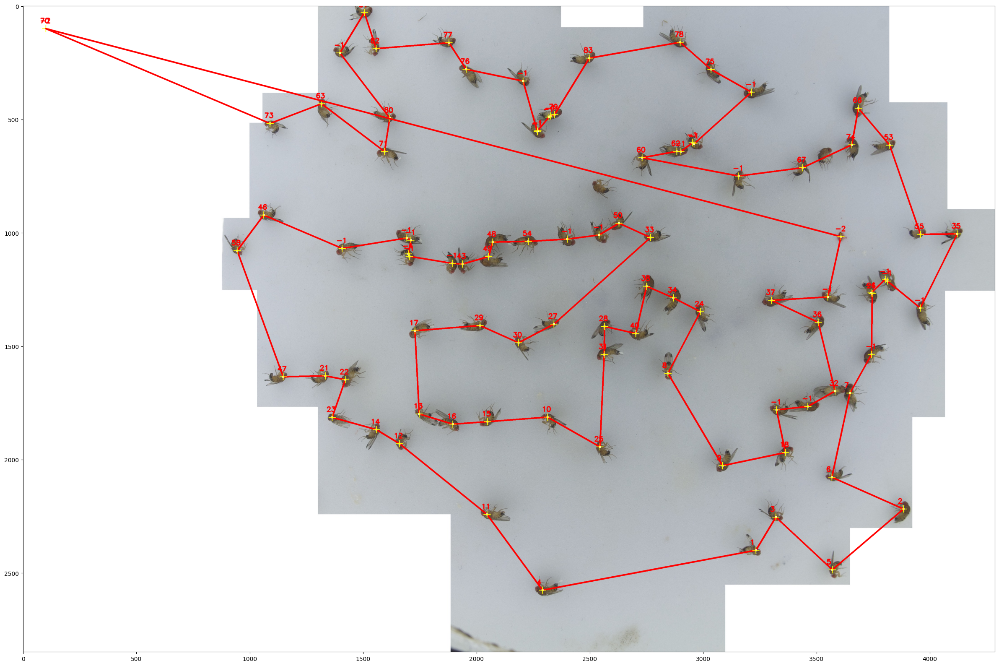

In [39]:
# LOCAL SEARCH

from ant_colony import AntColonyLS as ACLS

# Aplico local search 

ls = ACLS(adj_mat, len(sg), 1, 100, 0.95, 1, 1)     


sp = ls.local_search(sg)

print(sp)

ls_path = []

for i in range(len(sp[0])):
    ls_path.append(sp[0][i][0])

ls_path.append(0)
route_graph(img_orig, path, ls_path)


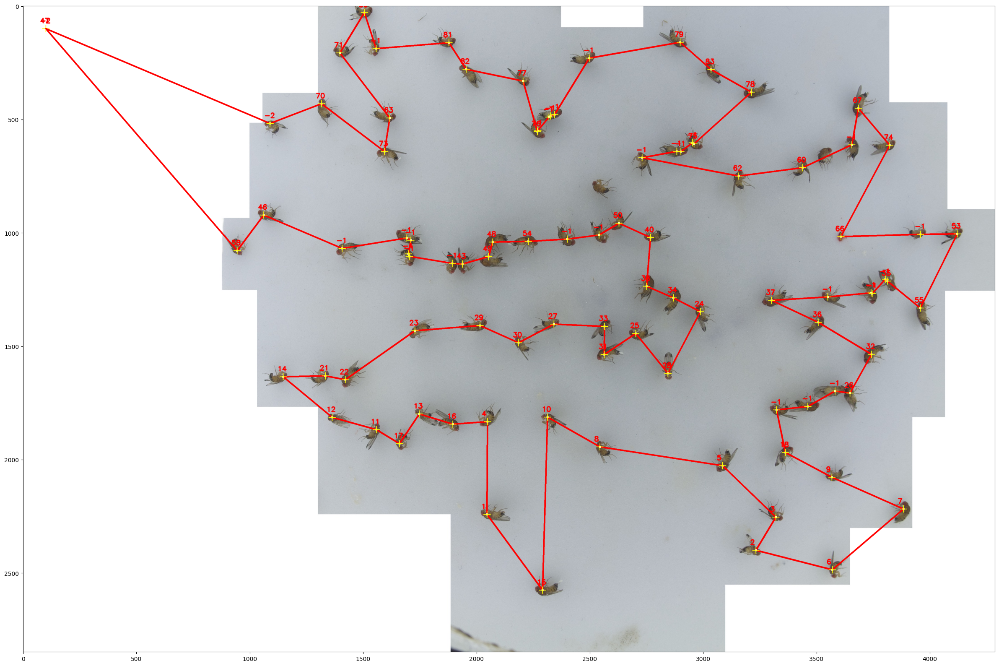

In [40]:
# ANT COLONY OPTIMIZATION

ant_colony_ls = ACLS(adj_mat, 10, 5, 50, 0.95, 1, 1)        

sp = ant_colony_ls.run()

aco_path = []

for i in range(len(sp[0])):
    aco_path.append(sp[0][i][0])

aco_path.append(0)

route_graph(img_orig, path, aco_path)


## EXTRACCION DE DATASET
Extrae en png todos los recuadros

In [ ]:

import os

path = "../TPF_CEIA/"
jpg_list = [s for s in os.listdir(path) if s.endswith('.jpg')]


for i in range(len(jpg_list)):
    print('lee:', path+jpg_list[i])



    nf = jpg_list[i].replace('.jpg','') + '-' + 'XXX.jpg'
    print('escribe: ', nf)


In [ ]:
drosophila.head()

In [ ]:
img_orig = cv2.imread('../TPF_CEIA/002.jpg', cv2.COLOR_BGR2RGB) 
img_orig = cv2.cvtColor(img_orig, cv2.COLOR_RGB2BGR)
drosophila.drop(drosophila.index, inplace=True)
img_pre = image_threshold(img_orig, 150, 3, 230, 255)
img_de = image_erodil(img_pre, 10, 10, 3)
img_c = image_contours(img_de, img_orig, drosophila, False)
plt.figure(figsize = (200,20))
plt.imshow(img_c) 


In [ ]:


import os

rect = 150
path = "../TPF_CEIA/"
jpg_list = [s for s in os.listdir(path) if s.endswith('.jpg')]


for i in range(len(jpg_list)):
    print('lee:', path+jpg_list[i])
    img_o = cv2.imread(path+jpg_list[i], cv2.COLOR_BGR2RGB) 
    img_o = cv2.cvtColor(img_o, cv2.COLOR_RGB2BGR)

    drosophila.drop(drosophila.index, inplace=True)

    img_pre = image_threshold(img_o, 150, 3, 230, 255)
    img_de = image_erodil(img_pre, 10, 10, 3)
    img_c = image_contours(img_de, img_orig, drosophila, False)
    img_o = cv2.cvtColor(img_o, cv2.COLOR_BGR2RGB)

    for _, row in drosophila[drosophila.state=="sin clasificar"].iterrows():
        roi = img_o[row.y:row.y+rect, row.x:row.x+rect]

        nf = './dataset/' + jpg_list[i].replace('.jpg','') + '-' + str(row.id) + '.png'
        print('escribe: ', nf)
        cv2.imwrite(nf , roi)




    






